# Рынок заведений общественного питания Москвы

**Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.**

- Необходимо провести исследование рынка общественного питания Москвы;

- Выделить интересные особенности и закономерности;

- Подготовить рекомендации по открытию кофейни для инвесторов.

**Описание данных:**

- Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

- Файл `/datasets/moscow_places.csv:`
   
   - `name` - название заведения;
   
   - `address`- адрес заведения;
   
   - `category` - категория заведения, например «кафе», «пиццерия» или «кофейня»;
   
   - `hours` - информация о днях и часах работы;
   
   - `lat` - широта географической точки, в которой находится заведение;
   
   - `lng` - долгота географической точки, в которой находится заведение;
   
   - `rating` - рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
   
   - `price` -  категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
   
   - `avg_bill` -  строка, которая хранит среднюю стоимость заказа в виде диапазона;
   
   - `middle_avg_bill` - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
   
   - `middle_coffee_cup` - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
   
   - `chain` - число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (0 — заведение не является сетевым 1 — заведение является сетевым);
   
   - `district` - административный район, в котором находится заведение, например Центральный административный округ;
   
   - `seats` - количество посадочных мест.
   

 **План работы:**

1. Загрузить данные и изучить общую информацию;

2. Выполнить предобработку данных;

3. Исследовательский анализ рынка общепита и выводы;

4. Детализированное исследование по открытию кофейни и выводы;

5. Презентация

# 1. Загрузка данных изучение общей информации

In [5]:
%pip install folium

In [6]:
# импорт библиотек
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(15, 6)})
import plotly.express as px
from plotly import graph_objects as go

from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
import json

In [7]:
# загрузка данных

moscow_places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [8]:
# просмотр данных:

display(moscow_places.head())
display(moscow_places.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

**Выводы по 1 разделу:**

- Всего в данных 8406 строк и 14 столбцов;

- Стилистика в названии стобцов правильная  "snake_case";

- Есть пропуски в 6 столбцах;

- Столбец chain нужно перевести в булевый тип.

# 2. Предобработка данных

# Преобразуем данные к нужным типам

In [12]:
moscow_places['chain'] = moscow_places['chain'].astype('bool')

In [13]:
# проверка
moscow_places.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                   bool
seats                float64
dtype: object

# Проверка на дубликаты

In [15]:
# проверка на явные дубликаты

print('\033[1m' + 'Количество дубликатов в таблице:' + '\033[0m',moscow_places.duplicated().sum())

Количество дубликатов в таблице: 0


Явных дубликатов нет. Проверим на неявные дубликаты.

In [17]:
# проверка на неявные дубликаты - по имени и адресу 
# понижаем регистр

moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places['address'] = moscow_places['address'].str.lower()

print('\033[1m' + 'Количество дубликатов в таблице:' + '\033[0m',moscow_places.duplicated(['name', 'address']).sum())

Количество дубликатов в таблице: 4


In [18]:
#удаление дубликатов

moscow_places = moscow_places.drop_duplicates(subset=['name', 'address'])

In [19]:
# проверим

print('\033[1m' + 'Количество дубликатов в таблице:' + '\033[0m',moscow_places.duplicated(['name', 'address']).sum())

Количество дубликатов в таблице: 0


# Обработка пропусков

In [21]:
#посмотрим на процент пропущенных значений в столбцах

display(round(moscow_places.isna().sum()/len(moscow_places)*100,1))

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.5
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

Пропуски есть в столбцах: 

- hours;

- price;

- avg_bill;

- middle_avg_bill;

- middle_coffee_cup;

- seats.

Наиболее число пропусков в столбце `middle_coffee_cup` - заполнить такое количество пропусков не получится.

В столбцах `price`, `avg_bill`, `middle_avg_bill`, `seats` - пропущено данных более 40%. Удалить или заполнить такое количество пропусков невозможно.

Оставим пропуски как есть.

# Добавление столбцов для исследования

In [24]:
# добавим столбец street из столбца address

moscow_places['street'] = moscow_places['address'].str.split(', ', expand=True)[1]

In [25]:
# добавим булевый столбец is_24_7 

moscow_places['is_24/7'] = moscow_places['hours'].str.contains('ежедневно, круглосуточно') 

In [26]:
# проверим

display(moscow_places. head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,правобережная улица,False


**Выводы по 2 разделу:**

- Данные были подготовлены к дальнейшему исследованию:

    - Столбец chain приведен в булевый тип;
    
    - Данные были проверены на явные и неявные дубликаты - удалили 4 неявных дубликата;
    
    - Были обнаружены пропуски, но так как пропусков более 40%, было принято решение не удалять и не заполнять их, чтобы не исказить данные;
    
    - Добавлены для исследования столбцы `street` с названием улицы и булевый столбец `is_24_7`. 

# 3. Исследовательский анализ рынка общепита

# Количество объектов общественного питания по категориям

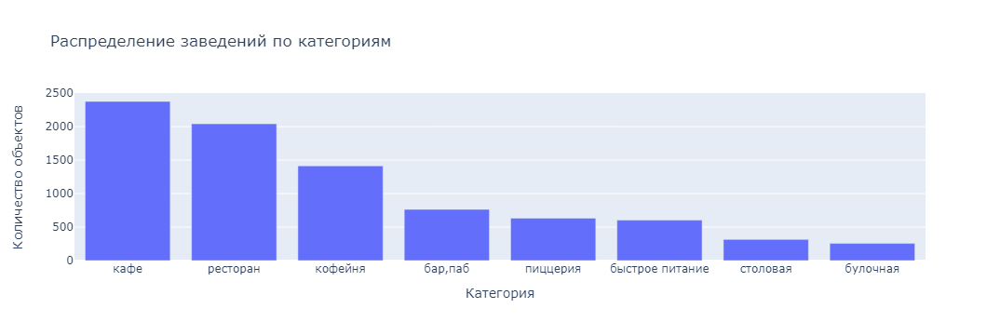

In [30]:
# агрегация данных
categories = (
    moscow_places
    .groupby('category')['name'].count()
    .reset_index()
    .sort_values(by='name', ascending=False)
)

# строим график
 
fig = px.bar(categories, 
             x='category', 
             y= 'name', 
             title = 'Распределение заведений по категориям')
fig.update_layout(xaxis_title = 'Категория',
                 yaxis_title = 'Количество объектов'
                 )

fig.update_traces(hovertemplate = 'Категория заведения : %{x} <br>Количество: %{y}')

fig.show()

- Больше всего заведений общественного питания - это кафе и рестораны;

- Меньше всего - столовые и булочные.

# Распределение посадочных мест по категориям

In [33]:
# агрегация данных

seats = (
    pd.pivot_table(moscow_places, index = 'category', values='seats', aggfunc=['min', 'median', 'mean', 'max'])
    .reset_index()
)
seats

,category,min,median,mean,max
,,seats,seats,seats,seats
0,"бар,паб",0.0,82.0,124.477516,1288.0
1,булочная,0.0,50.0,89.385135,625.0
2,быстрое питание,0.0,65.0,98.891117,1040.0
3,кафе,0.0,60.0,97.365653,1288.0
4,кофейня,0.0,80.0,111.199734,1288.0
5,пиццерия,0.0,55.0,94.496487,1288.0
6,ресторан,0.0,86.0,121.892041,1288.0
7,столовая,0.0,75.5,99.750000,1200.0


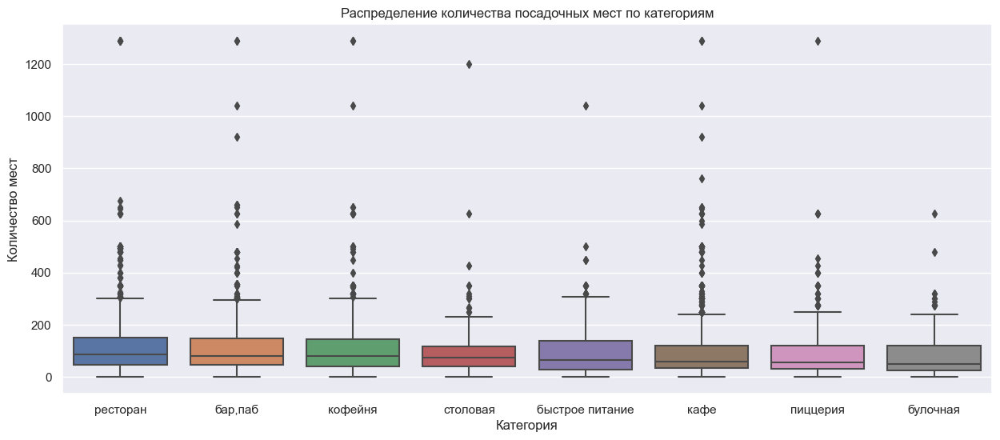

In [34]:
# сгруппируем боксплоты по убыванию медианы
moscow_groupby = (
    moscow_places.groupby(by=['category'])['seats'].median()
    .sort_values(ascending = False).index
)

# график

sns.boxplot(data=moscow_places,x='category', y='seats', order=moscow_groupby)
plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.show()

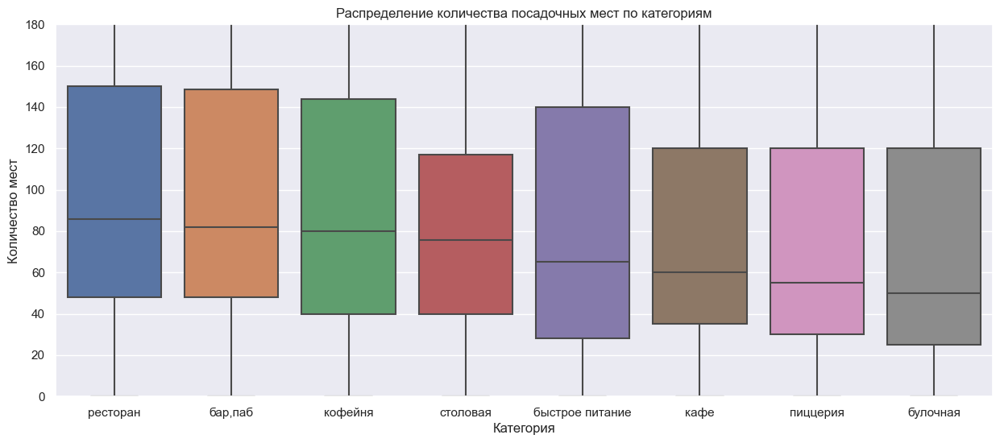

In [35]:
# расмотрим график подробнее

sns.boxplot(data=moscow_places,x='category', y='seats', order=moscow_groupby)
plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.ylim (0, 180)
plt.show()

- Больше всего посадочных мест по медианным значениям в ресторанах и барах около 80-90 посадочных мест;

- Меньше всего - в пицериях и булочных 50 посадочных мест;

- Верхняя граница - около 250-300 посадочных мест;

- Максимальное количество посадочных мест в барах, кафе, кофейнях, пицериях, ресторанах 1288. Это очень похоже на выбросы в данных. 

# Соотношение сетевых и несетевых заведений

In [38]:
# агрегация данных
chain_counts = (
    moscow_places.groupby('chain')['name'].count().reset_index()
    .rename(columns={'name': 'count'})
)
chain_counts['chain'] = chain_counts['chain'].replace(False,'несетевое')
chain_counts['chain'] = chain_counts['chain'].replace(True, 'сетевое')
chain_counts

,chain,count
0,несетевое,5199
1,сетевое,3203


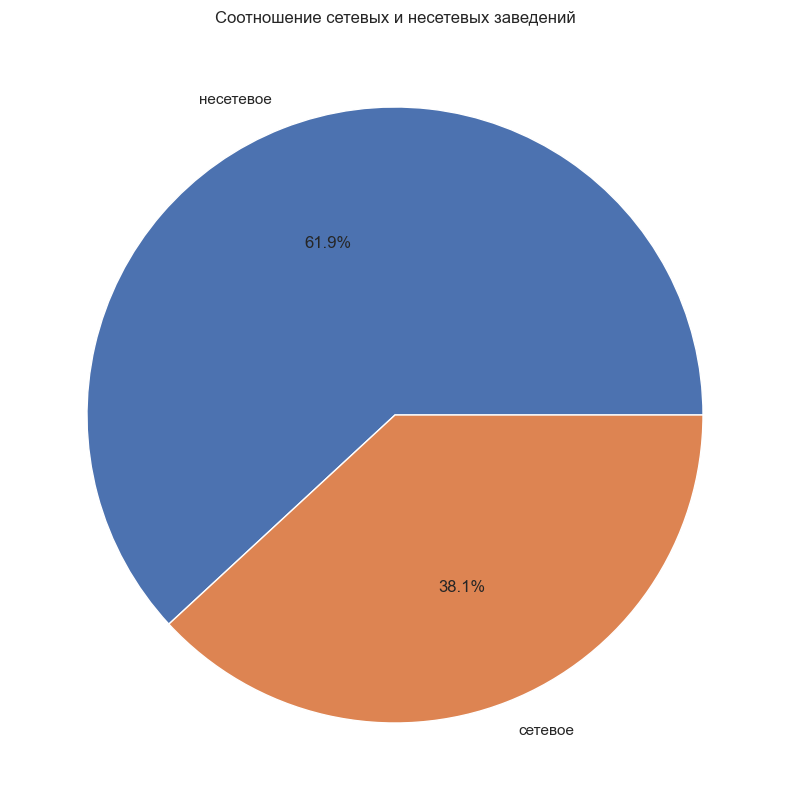

In [39]:
plt.figure(figsize=(10, 10))
plt.pie(chain_counts['count'], labels=chain_counts['chain'], autopct='%1.1f%%')
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

- Несетевых заведений больше чем сетевых 61,9 % против 38,1 %.

# Соотношение сетевых и несетевых заведений по категориям

In [42]:
chain_category = (
    moscow_places
    .groupby(['category', 'chain'], as_index=False)
    .agg({'name': 'count'})
    .rename(columns={'name': 'count'})
    .sort_values(by='count', ascending=False)
)
chain_category['chain'] = chain_category['chain'].replace({True: 'сетевое', False: 'несетевое'})
chain_category

,category,chain,count
6,кафе,несетевое,1597
12,ресторан,несетевое,1313
7,кафе,сетевое,779
13,ресторан,сетевое,729
9,кофейня,сетевое,720
8,кофейня,несетевое,693
0,"бар,паб",несетевое,596
4,быстрое питание,несетевое,371
11,пиццерия,сетевое,330
10,пиццерия,несетевое,303


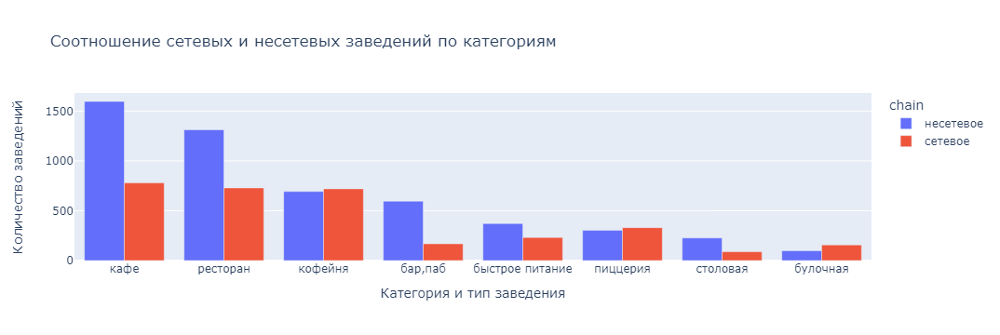

In [43]:
fig = px.bar(chain_category, 
             x='category', 
             y= 'count', 
             title = 'Соотношение сетевых и несетевых заведений по категориям', 
             color='chain', barmode='group')
fig.update_layout(xaxis_title = 'Категория и тип заведения',
                  yaxis_title = 'Количество заведений')
fig.update_traces(hovertemplate = 'Категория заведения : %{x} <br>Количество: %{y}')

fig.show()

- Сетевых заведений больше в кофейнях, пиццериях и булочных;

- Несетевых заведений гораздо больше в кафе, ресторанах и барах.

# ТОП-15 популярных сетей в Москве

In [46]:
top_15 = (
    moscow_places.query('chain == 1').pivot_table(index=['name', 'category'],  values='chain', aggfunc='count').reset_index()
    .sort_values(by='chain', ascending=False).rename(columns={'chain':'count'}).head(15).reset_index()
)
top_15

,index,name,category,count
0,1126,шоколадница,кофейня,119
1,496,домино'с пицца,пиццерия,76
2,489,додо пицца,пиццерия,74
3,205,one price coffee,кофейня,71
4,1142,яндекс лавка,ресторан,69
5,72,cofix,кофейня,65
6,241,prime,ресторан,49
7,617,кофепорт,кофейня,42
8,632,кулинарная лавка братьев караваевых,кафе,39
9,963,теремок,ресторан,36


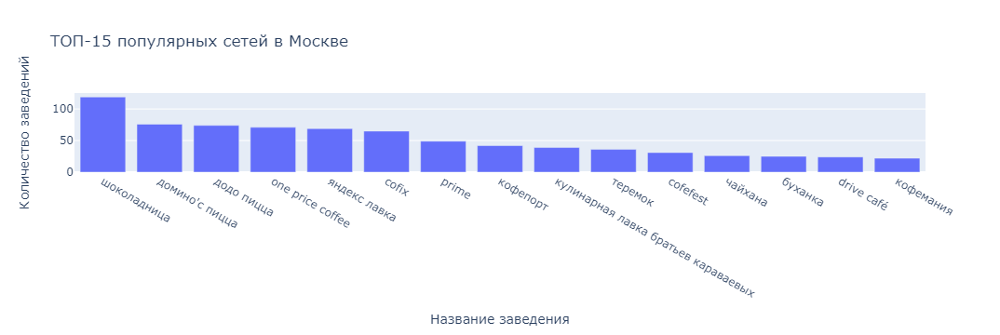

In [47]:
# график
fig = px.bar(top_15 , 
             x='name', 
             y= 'count', 
             title = 'ТОП-15 популярных сетей в Москве', 
            )
fig.update_layout(xaxis_title = 'Название заведения',
                 yaxis_title = 'Количество заведений')
fig.update_traces(hovertemplate = 'Название заведения : %{x} <br>Количество: %{y}')

fig.show()

In [48]:
# агрегация
top_15 = top_15.groupby('category')['name'].count().reset_index()
top_15.columns = ['category', 'quantity']
top_15

# расчитаем процент категории

top_15['percent'] = top_15['quantity'] / 15 * 100
top_15['percent'] = top_15['percent'].round(2)
top_15 = top_15.sort_values(by='percent', ascending=False)
top_15

,category,quantity,percent
2,кофейня,6,40.00
1,кафе,3,20.00
4,ресторан,3,20.00
3,пиццерия,2,13.33
0,булочная,1,6.67


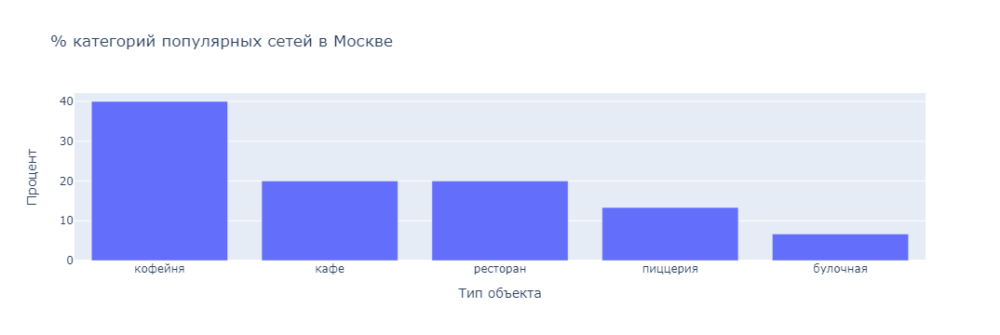

In [49]:
# график

fig = px.bar(top_15 , 
             x='category', 
             y= 'percent', 
             title = '% категорий популярных сетей в Москве', 
            )
fig.update_layout(xaxis_title = 'Тип объекта',
                 yaxis_title = 'Процент')
fig.update_traces(hovertemplate = 'Тип объекта : %{x} <br>Процент: %{y}')

fig.show()

- Практически все сети очень известны;

- Среди популярных сетей лидируют кофейни: 40 %;

- В ТОП-15 отсутствуют столовые, бары, быстрое питание. Скорее всего эти типы объекта относятся к несетевым заведениям, либо не распространены в Москве.

# Административные районы Москвы

In [52]:
# агрегация
districts = moscow_places.groupby('district')['name'].count().reset_index()
districts.columns=['district', 'total']
districts = districts.sort_values(by='total', ascending=False)
districts

,district,total
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [53]:
# агрегация
districts_category = moscow_places.groupby(['district', 'category'], as_index=False)['name'].count().rename(columns={'name':'count'})
districts_category

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [54]:
# соединим две таблицы

total = districts_category.merge(districts, how='inner', on='district')
total

,district,category,count,total
0,Восточный административный округ,"бар,паб",53,798
1,Восточный административный округ,булочная,25,798
2,Восточный административный округ,быстрое питание,71,798
3,Восточный административный округ,кафе,272,798
4,Восточный административный округ,кофейня,105,798
...,...,...,...,...
67,Южный административный округ,кафе,264,892
68,Южный административный округ,кофейня,131,892
69,Южный административный округ,пиццерия,73,892
70,Южный административный округ,ресторан,202,892


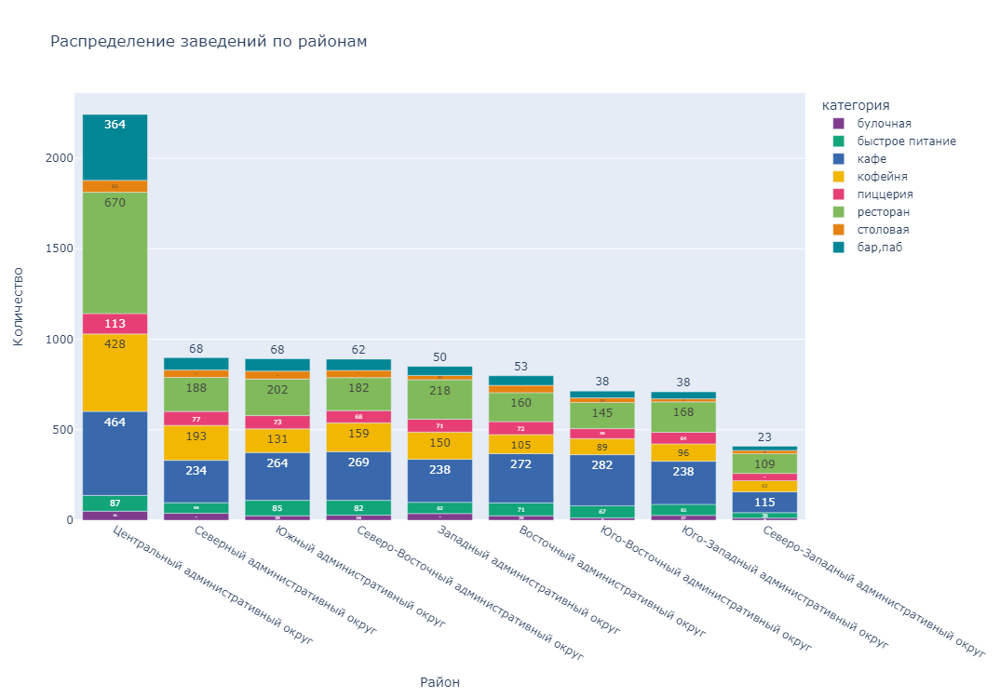

In [55]:
fig = px.bar(total.sort_values(by='total', ascending=False), 
             x='district', 
             y='count', 
             title='Распределение заведений по районам', 
             color='category',
             height= 750, 
             color_discrete_sequence=px.colors.qualitative.Bold, 
             text='count', 
             labels={'total': 'количество', 'district': 'район', 'category': 'категория'},)
fig.update_xaxes(title='Район')
fig.update_yaxes(title='Количество')
fig.show()

- По общему количеству заведений лидирует Центральный административный округ;

- Наименьшее количество заведений в Северо-Запалном административном округе;

- Во всех округах кроме центрального лидирует категория кафе, в центральном округе лидером является категория рестораны;

- Распределение категорий заведений во всех округах кроме центрального и северо-западного очень похоже.

# Средние рейтинги по категориям заведений

In [58]:
rating = moscow_places.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()
rating.columns=['category', 'mean_rating']
rating['mean_rating'] = rating['mean_rating'].round(2)
rating

,category,mean_rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


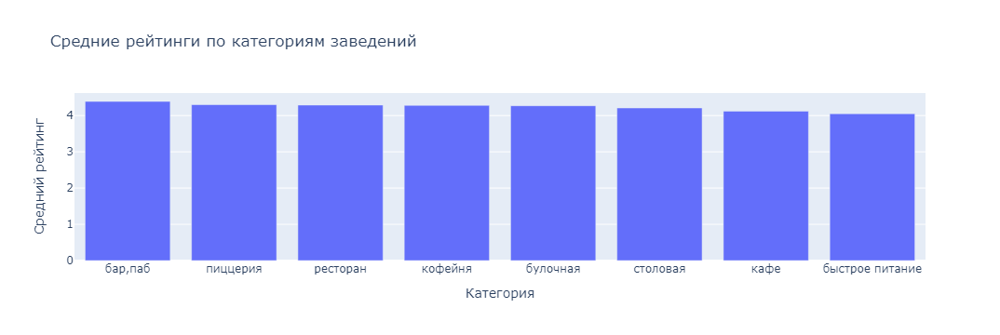

In [59]:
# график

fig = px.bar(rating , 
             x='category', 
             y= 'mean_rating', 
             title = 'Средние рейтинги по категориям заведений', 
            )
fig.update_layout(xaxis_title = 'Категория',
                 yaxis_title = 'Средний рейтинг')
fig.update_traces(hovertemplate = 'Категория : %{x} <br>Средний рейтинг: %{y}')

fig.show()

- В целом средние рейтинги не отличаются по категориям и находятся в пределах 4 - 4,5.

- Наиболее высокий рейтинг 4,39 у баров и пабов, наиболее низкий у категории быстрое питание (4,05).

#  Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [62]:
# средний рейтинг заведений каждого района

mean_rating = (
    moscow_places.groupby('district', as_index=False)['rating'].agg('mean')
    .sort_values(by='rating', ascending=False)
    .reset_index(drop=True)
)
mean_rating['rating'] = mean_rating['rating'].round(2)
mean_rating

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [63]:
# загрузка данных с границами районов

import requests
import json

url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
response = requests.get(url)
response.raise_for_status() 
data = response.json()

geo_json = data 

In [64]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data= geo_json,
    data=mean_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

#  Отображение всех заведений на карте

In [66]:
# создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаем пустой кластер, добавляем на карту
marker_cluster = MarkerCluster().add_to(m)

# создаем функцию 
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию для датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

- По количеству заведений лидирует центральный район.

# ТОП-15 улиц по количеству заведений

In [69]:
top_15_street_total = (
    moscow_places.pivot_table(index=['street'], values='name', aggfunc='count').reset_index()
    .sort_values(by='name', ascending=False).rename(columns={'name':'total'}).head(15)
)
top_15_street_total

,street,total
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [70]:
# список из топ 15 улиц
top_15_street_list = top_15_street_total['street'].tolist()

#Группировка заведений по улицам и категориям
top_15_street_categories = (
    moscow_places[moscow_places['street'].isin(top_15_street_list)]
    .groupby(by=['street', 'category'])
    .agg(count=('name','count'))
    .sort_values('count',ascending=False).reset_index()
)
top_15_street_categories

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


In [71]:
# сводная таблица

top_15_street = top_15_street_categories.merge(top_15_street_total, how='inner', on='street')
top_15_street.columns = ['street', 'category', 'count', 'total']
top_15_street

,street,category,count,total
0,проспект мира,кафе,53,183
1,проспект мира,ресторан,45,183
2,проспект мира,кофейня,36,183
3,проспект мира,быстрое питание,21,183
4,проспект мира,пиццерия,11,183
...,...,...,...,...
106,улица вавилова,быстрое питание,11,55
107,улица вавилова,кофейня,10,55
108,улица вавилова,пиццерия,3,55
109,улица вавилова,булочная,2,55


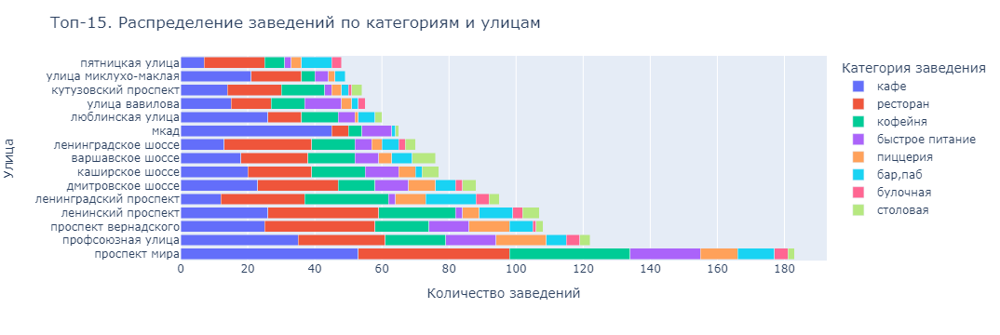

In [72]:
# график

fig = px.bar(top_15_street, x='count',\
            y='street', orientation='h', color='category')
fig.update_layout(showlegend= True, 
                  title='Топ-15. Распределение заведений по категориям и улицам', 
                  legend_title='Категория заведения', 
                  xaxis_title='Количество заведений', 
                  yaxis_title='Улица')
fig.update_layout(barmode='stack',\
                  yaxis={'categoryorder':'array', 'categoryarray':top_15_street_list})
fig.show() 

- По количеству заведений лидирует Проспект мира, Профсоюзная улица, Проспект Вернадского;

- Наибольшее количество заведений находятся на проспектах и шоссе: на оживленных улицах больше заведений;

- По категориям заведений лидируют кафе, рестораны и кофейни.

# Улицы, на которых находится только один объект общепита

In [75]:
# агрегация и фильтр

one_object_street = (
    moscow_places.groupby('street').agg(count=('name', 'count'))
    .sort_values('count').query('count==1').reset_index()
)
display(one_object_street)
one_object_street.shape

,street,count
0,1-й автозаводский проезд,1
1,новосущёвская улица,1
2,новощукинская улица,1
3,новоясеневский тупик,1
4,одинцовская улица,1
...,...,...
452,1-й голутвинский переулок,1
453,валдайский проезд,1
454,1-й грайвороновский проезд,1
455,балакиревский переулок,1


(457, 2)

In [76]:
# создание списка улиц
street_list = one_object_street['street'].tolist()

# группировка заведений по категориям
one_object_category = (
    moscow_places[moscow_places['street'].isin(street_list)]
    .groupby('category')
    .agg(count=('name','count')).sort_values('count',ascending=False)
    .reset_index())

one_object_category

,category,count
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


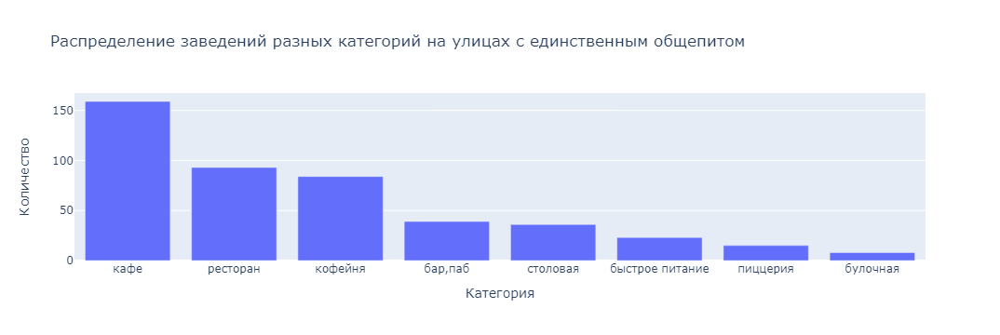

In [77]:
# график

fig = px.bar(one_object_category , 
             x='category', 
             y= 'count', 
             title = 'Распределение заведений разных категорий на улицах с единственным общепитом', 
            )
fig.update_layout(xaxis_title = 'Категория',
                 yaxis_title = 'Количество')
fig.update_traces(hovertemplate = 'Категория: %{x} <br>Количество: %{y}')

fig.show()

In [78]:
# Отобразим на карте расположение улиц и сами объекты

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
moscow_places.query('street in @street_list').apply(create_clusters, axis=1)
m 

- В городе 457 улиц на которых присутствует только один объект общепита;

- По категориям лидируют кафе, рестораны и кофейни;

- Один объект общепита располагается преимущественно на небольших улицах.

# Средний чек для каждого района

In [81]:
# агрегация 
district_median_avg_bill=(
    moscow_places.groupby('district').agg(median=('middle_avg_bill','median'))
    .sort_values('median', ascending=False)
    .reset_index()
)
district_median_avg_bill

,district,median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [82]:
# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=geo_json,
    data=district_median_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведения по районам',
).add_to(m)

m

- Самый высокий чек в Западном и Центральном административном округе;

- Самый низкий в Южном и Юго-Восточном административном округе;

- Можно отметить, что влияние на средний чек может оказывать большее количество заведений, находящихся в центральном районе, по сравнению, например с Юго-Восточным.


**Выводы по 3 разделу:**

***Было проведено десять исследований:***

---

**1. Количество объектов общественного питания по категориям:**

   - Больше всего заведений общественного питания - это кафе и рестораны;

   - Меньше всего - столовые и булочные.
   
---

**2. Распределение посадочных мест по категориям:**

   - Больше всего посадочных мест по медианным значениям в ресторанах и барах около 80-90 посадочных мест;

   - Меньше всего - в пицериях и булочных 50 посадочных мест;

   - Верхняя граница - около 250-300 посадочных мест.
   
   
---

**3. Соотношение сетевых и несетевых заведений:**
 
   - Несетевых заведений больше чем сетевых 61,9 % против 38,1 %.
   

---

**4. Соотношение сетевых и несетевых заведений по категориям:**

   - Сетевых заведений больше в кофейнях, пицериях и булочных;

   - Несетевых заведений гораздо больше в кафе, ресторанах и барах.
   

---

**5. ТОП-15 популярных сетей в Москве:**

   - Практически все сети очень известны;

   - Среди популярных сетей лидируют кофейни: 40 %;

   - В ТОП-15 отсутствуют столовые, бары, быстрое питание. 
   
---

**6. Административные районы Москвы:**

   - По общему количеству заведений лидирует Центральный административный округ;

   - Наименьшее количество заведений в Северо-Запалном административном округе;

   - Во всех округах кроме центрального лидирует категория кафе, в центральном округе лидером является категория рестораны;

   - Распределение категорий заведений во всех округах кроме центрального и северо-западного очень похоже.
   
---

**7. Средние рейтинги по категориям заведений:**

   - В целом средние рейтинги не отличаются по категориям и находятся в пределах 4 - 4,5.

   - Наиболее высокий рейтинг 4,39 у баров и пабов, наиболее низкий у категории быстрое питание (4,05).
   
---

**8. ТОП-15 улиц по количеству заведений:**

   - По количеству заведений лидирует Проспект мира, Профсоюзная улица, Проспект Вернадского;

   - Наибольшее количество заведений находятся на проспектах и шоссе: на оживленных улицах больше заведений;

   - По категориям заведений лидируют кафе, рестораны и кофейни.
   
---

**9. Улицы, на которых находится только один объект общепита:**

   - В городе 457 улиц на которых присутствует только один объект общепита;

   - По категориям лидируют кафе, рестораны и кофейни;

   - Один объект общепита располагается преимущественно на небольших улицах.
   
---

**10. Средний чек для каждого района:**

   - Самый высокий чек в Западном и Центральном административном округе;

   - Самый низкий в Южном и Юго-Восточном административном округе;

   - Можно отметить, что влияние на средний чек может оказывать большее количество заведений, находящихся в центральном районе, по сравнению, например с Юго-Восточным.

# 4. Детализированное исследование по открытию кофейни и выводы

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

# Количество кофеен. Районы и особенности расположения

In [88]:
# отдельный датафрейм для кофеен

coffee_shop = moscow_places.query('category == "кофейня" ')
display(coffee_shop.head())
coffee_shop.shape

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,True,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,True,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,True,NaN,улица дыбенко,False


(1413, 16)

In [89]:
# количество кофеен по районам

districts_coffee_shop = (
    coffee_shop.groupby(by=['district'])
    .agg(count=('name','count')).reset_index()
    .sort_values('count', ascending=False)
)
districts_coffee_shop

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [90]:
# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=geo_json,
    data=districts_coffee_shop,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Расположение кофеен по районам',
).add_to(m)

m

- В Москве 1413 кофеен;

- Большинство располагается в центральном районе;

- Меньше всего кофеен в Северо-Западном административном округе.

# Круглосуточные кофейни

In [93]:
# агрегация по режиму работы 

coffee_shop_24_7 = (
    coffee_shop.groupby('is_24/7')['name'].count()
    .reset_index()
)
coffee_shop_24_7.columns = ['is_24/7', 'count']
coffee_shop_24_7['is_24/7'] = coffee_shop_24_7['is_24/7'].replace(False,'не круглосуточная')
coffee_shop_24_7['is_24/7'] = coffee_shop_24_7['is_24/7'].replace(True, 'круглосуточная')
coffee_shop_24_7

,is_24/7,count
0,не круглосуточная,1339
1,круглосуточная,59


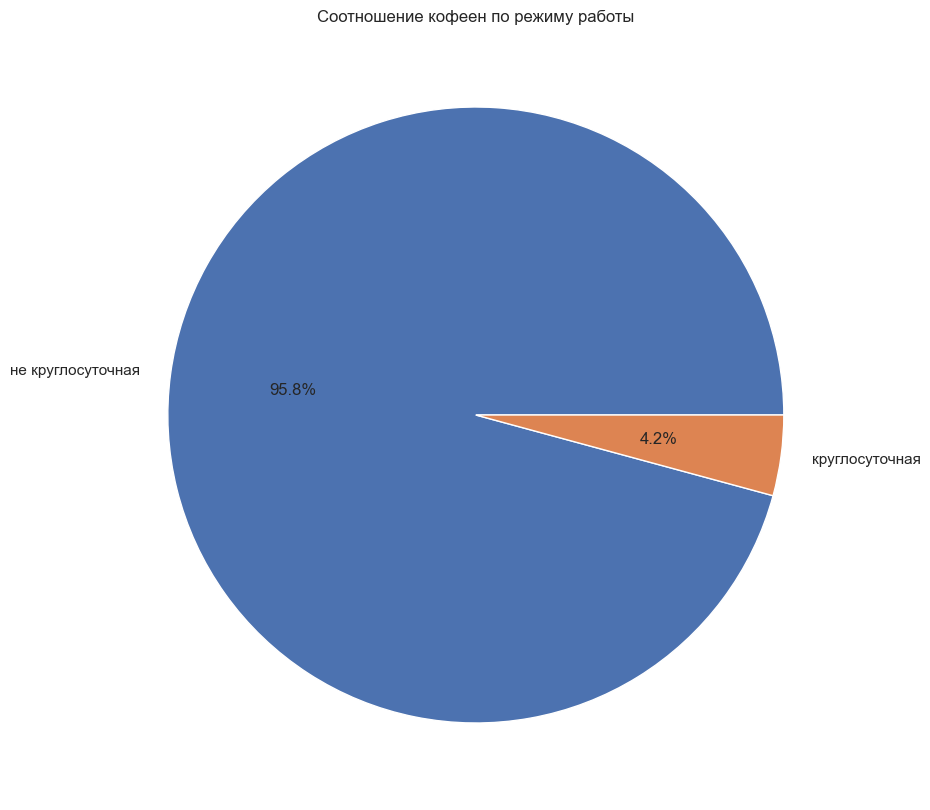

In [94]:
plt.figure(figsize=(10, 10))
plt.pie(coffee_shop_24_7['count'], labels=coffee_shop_24_7['is_24/7'], autopct='%1.1f%%')
plt.title('Соотношение кофеен по режиму работы')
plt.show()

- Всего в Москве 59 круглосуточных кофейни;

- По соотношению некруглосуточных кофеен в разы больше.

# Распределение рейтингов кофейни по районам

In [97]:
# средний рейтинг всех кофеен
mean_rating_coffee_shop = coffee_shop['rating'].mean().round(2)
print(f'Средний рейтинг кофеен в Москве - {mean_rating_coffee_shop}')

Средний рейтинг кофеен в Москве - 4.28


In [98]:
# распределение рейтинга по районам

coffee_shop_rating = coffee_shop.groupby('district', as_index=False)['rating'].mean().round(2)
coffee_shop_rating

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [99]:
# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=geo_json,
    data=coffee_shop_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по районам',
).add_to(m)

m

- Средний рейтинг кофеен в Москве 4,28;

- Наиболее высокие рейтинги кофеен в Центральном, Северо-Западном и в Северном районах.

# Средний чек капучино по округам

In [103]:
# средний чек капучино всех кофеен

average_bill_coffee_shop = round(coffee_shop['middle_coffee_cup'].median(), 2)
print(f'Средний чек капучино в Москве - {average_bill_coffee_shop}')

Средний чек капучино в Москве - 170.0


In [105]:
# распределение стоимости капучино по районам

coffee_shop_cup = (
                 coffee_shop.groupby('district', as_index=False)['middle_coffee_cup']
                 .mean().round(2)
                 .sort_values('middle_coffee_cup', ascending=False)
)
coffee_shop_cup


,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [107]:
# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=geo_json,
    data=coffee_shop_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Распределение средней стоимости капучино по районам',
).add_to(m)

m

- Средний чек капучино в Москве 170 р;

- Самая высока цена: Западный и центральный округ;

- Самая низкая - Юго-Восточный округ.

**Выводы по 4 разделу:**

***Рекомендации по открытию кофейни:***

---

1. В Москве очень много кофеен поэтому лучше выбрать район с меньшим количеством заведений: Центральноый район точно нет, можно рассмотреть Юго-Восточный, Северо-Западный округа. 

---
2. Круглосуточных кофеен очень мало, но необходимо дополнительное исследование о рентабельности такой кофейни в выбранном районе.

---
3. Необходимо выбрать место не с самым высоким рейтингом например Северо-Восточный, Юго-Восточный и Северный округ. Несмотря на то, что Западный округ имеет самый низкий рейтинг, он может не подойти из-за высокой стоимости чашки капучино.

---
4. Резюмируя, можно порекомендовать Юго-Восточный округ:

   - в этом районе меньшее количество заведений, значит и меньше конкуренция;
   
   - средний рейтинг заведений ниже среднего рейтинга по Москве;
   
   - самая низкая стоимость чашки капучино.

# 5. Презентация


* [Презентация](https://disk.yandex.ru/i/nOuzcTRVrPPjPQ) 